# Differentially expressed gene analysis on boundaries

In [1]:
#load packages
library(Seurat)
library(ggplot2)
library(magrittr)
library(data.table)
library(Matrix)
library(dplyr)
library(tibble)
library(MAST)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:data.table’:

    between, first, last


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: SingleCellExperiment

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘matrixStats’


The following object is masked from ‘package:dplyr’:

    count



Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
 

In [2]:
#load data
seu_PR <- readRDS(file = "../../data/seurat_object/Set3/seu_lateralect_PR_ID.obj")

In [3]:
seu_PR

An object of class Seurat 
28745 features across 1717 samples within 2 assays 
Active assay: SCT (11239 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, reumap

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
Warning message:
“Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session.”


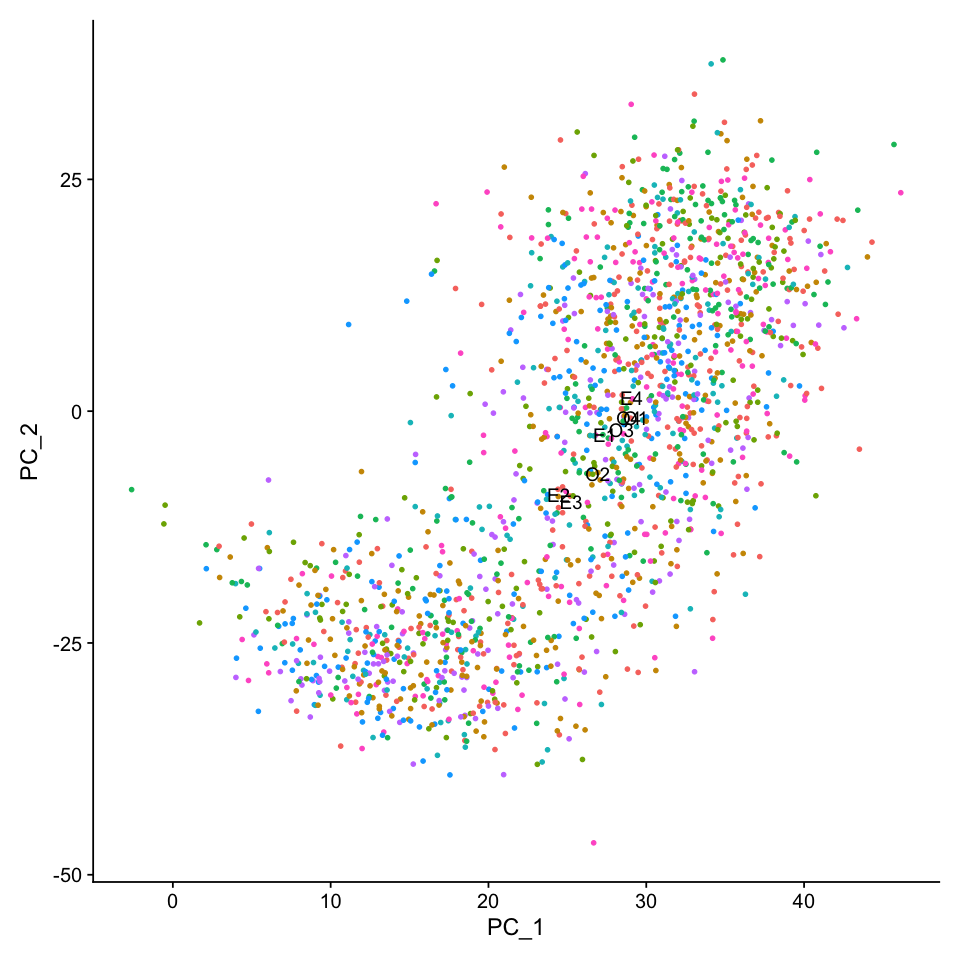

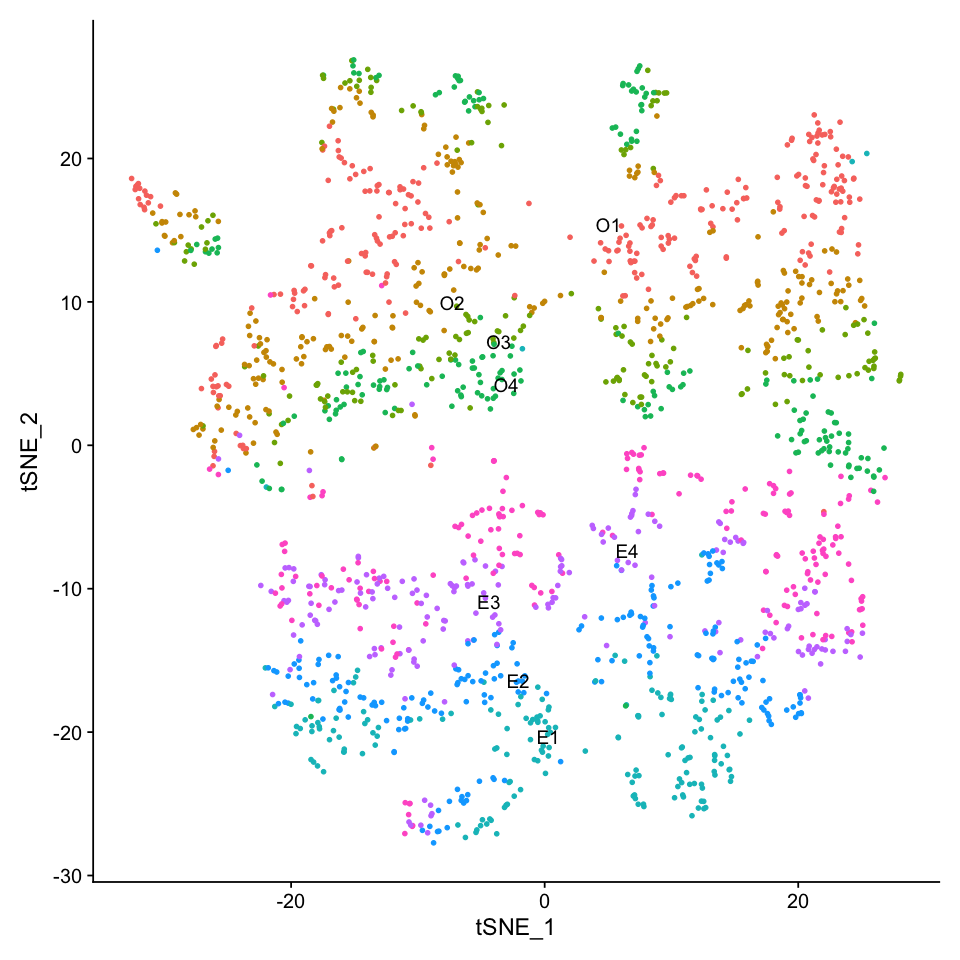

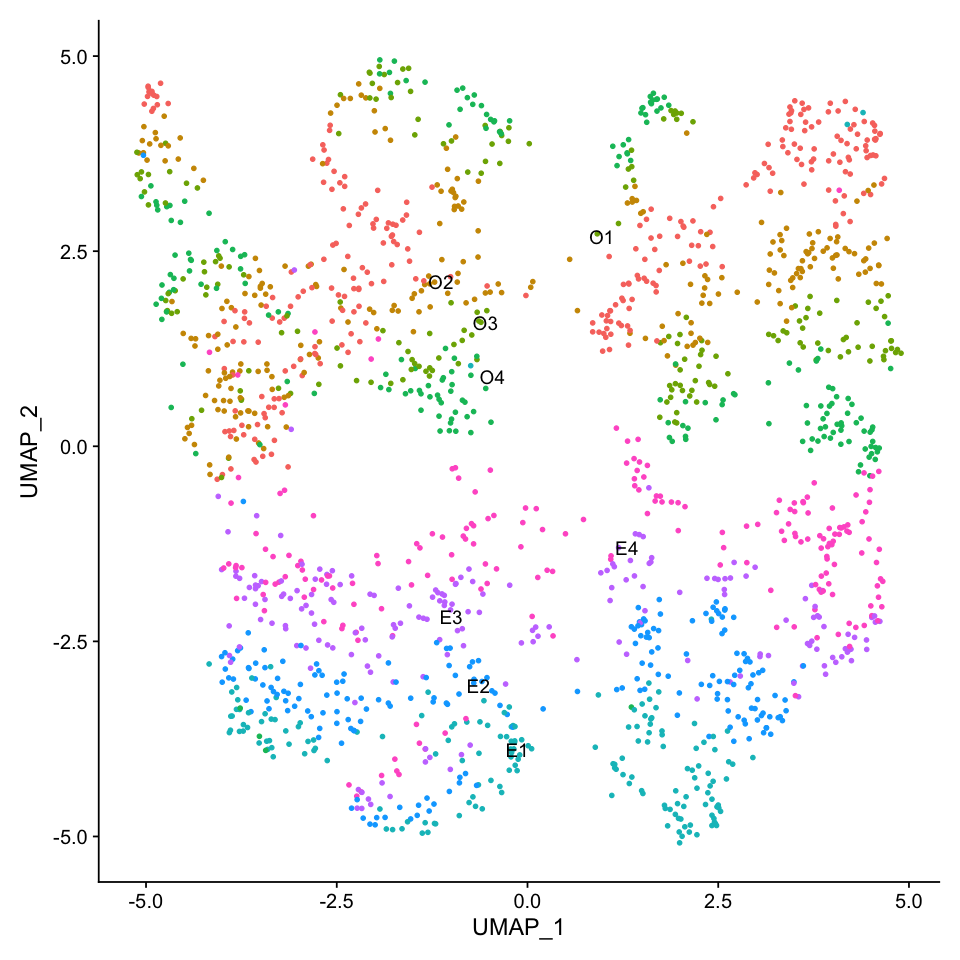

In [4]:
options(repr.plot.width=8, repr.plot.height=8)
seu_PR <- RunPCA(seu_PR, verbose = FALSE)
seu_PR <- RunTSNE(seu_PR, dims = 1:30, verbose = FALSE)
seu_PR <- RunUMAP(seu_PR, dims = 1:30, verbose = FALSE)
DimPlot(seu_PR, reduction =  "pca", label = TRUE) + NoLegend()
DimPlot(seu_PR, reduction =  "tsne", label = TRUE) + NoLegend()
DimPlot(seu_PR, reduction =  "umap", label = TRUE) + NoLegend()

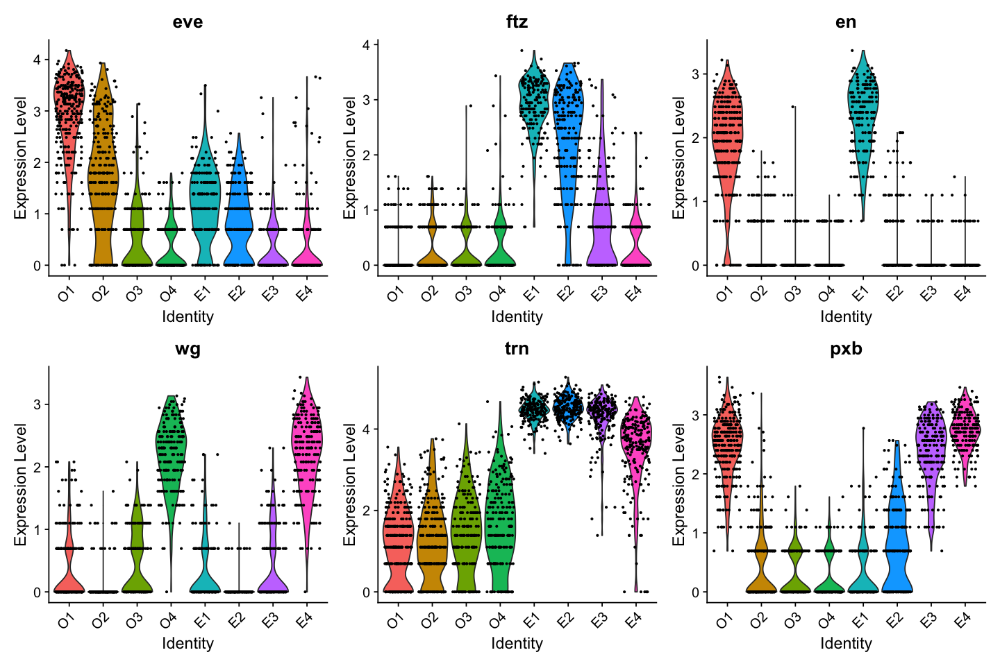

In [5]:
options(repr.plot.width=12, repr.plot.height=8)
VlnPlot(seu_PR, features = c("eve", "ftz", "en", "wg", "trn", "pxb"),  pt.size = 0.5) 

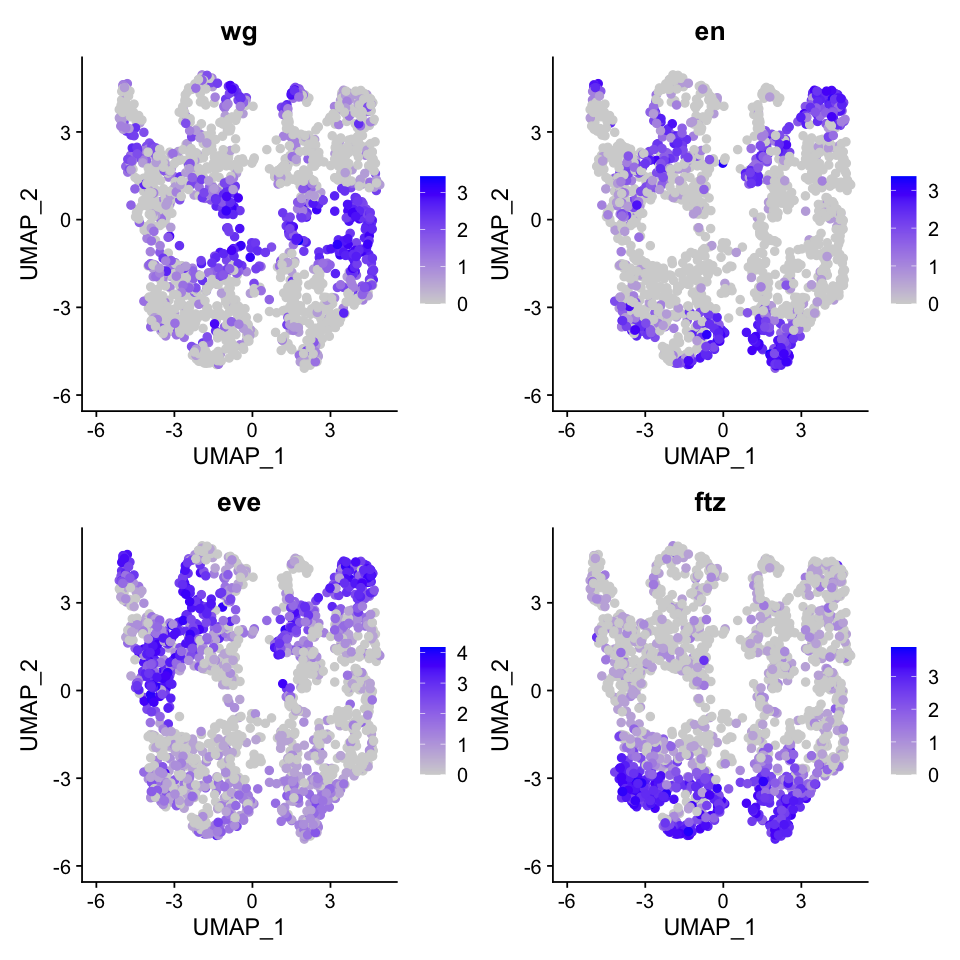

In [6]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu_PR, reduction = "umap", features = c("wg", "en", "eve", "ftz"), pt.size = 2,  ncol = 2)

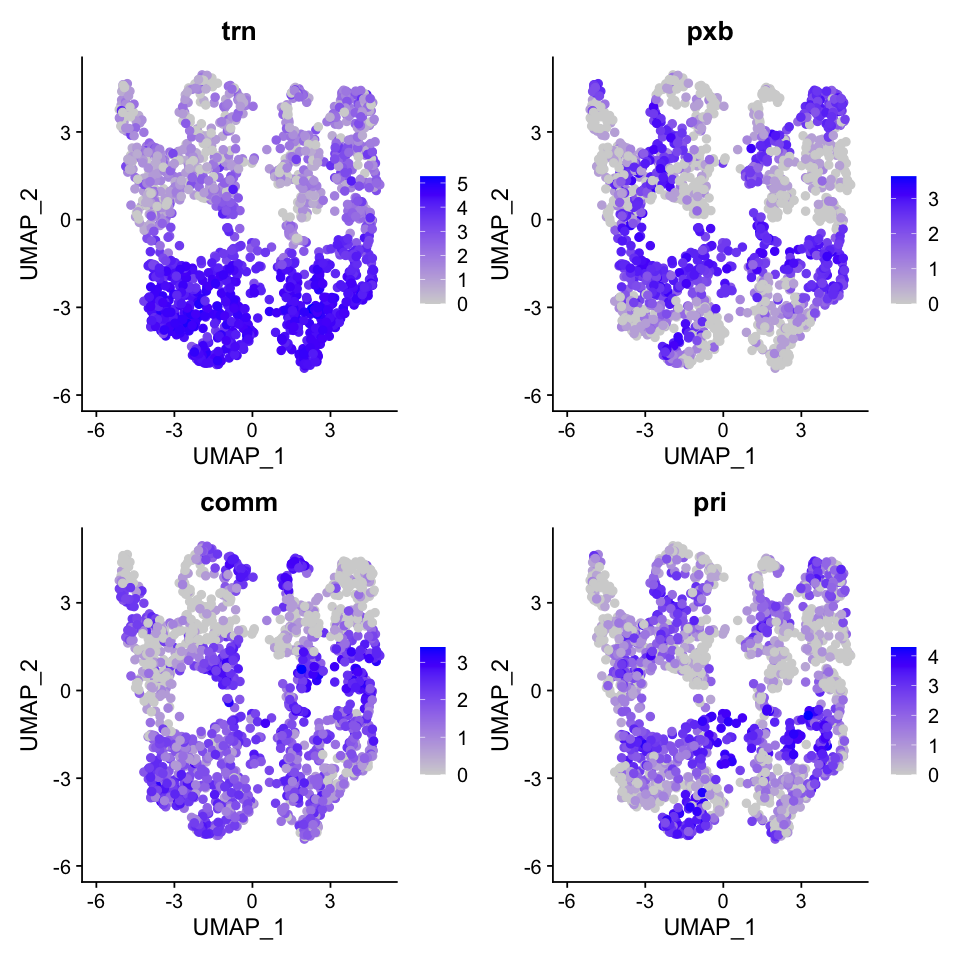

In [7]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu_PR, reduction = "umap", features = c("trn", "pxb", "comm", "pri"), pt.size = 2,  ncol = 2)

## DEG analysis

In [8]:
Idents(seu_PR) <- "pairrule_ID"

In [9]:
levels <- c("O1","O2","O3","O4", "E1","E2","E3","E4")
levels(seu_PR) <- levels

In [10]:
seu_PR_VF3000 <- seu_PR[VariableFeatures(seu_PR), ]
seu_PR_VF3000

An object of class Seurat 
6000 features across 1717 samples within 2 assays 
Active assay: SCT (3000 features, 3000 variable features)
 1 other assay present: RNA
 4 dimensional reductions calculated: pca, umap, reumap, tsne

### O1 vs. O2


Done!

Combining coefficients and standard errors

Calculating log-fold changes

Calculating likelihood ratio tests

Refitting on reduced model...


Done!



,p_val,avg_logFC,pct.1,pct.2,p_val_adj,compaired_ID
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
pxb,7.334201e-140,1.8718022,1.000,0.402,2.200260e-136,O1vsO2
hh,2.319608e-139,1.9208552,0.996,0.203,6.958825e-136,O1vsO2
en,1.535242e-109,1.8206127,0.944,0.199,4.605726e-106,O1vsO2
odd,2.486124e-95,-1.3606561,0.411,0.973,7.458371e-92,O1vsO2
gsb,2.544949e-77,2.2400056,0.814,0.123,7.634848e-74,O1vsO2
drm,9.135161e-69,-1.0551370,0.309,0.916,2.740548e-65,O1vsO2
sob,2.021455e-58,-0.9805319,0.298,0.889,6.064364e-55,O1vsO2
prd,1.366946e-49,1.2843001,0.775,0.226,4.100837e-46,O1vsO2
eve,1.688913e-42,0.9048521,0.989,0.835,5.066740e-39,O1vsO2


,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
pxb,7.334201e-140,1.8718022,1.000,0.402,2.200260e-136
hh,2.319608e-139,1.9208552,0.996,0.203,6.958825e-136
en,1.535242e-109,1.8206127,0.944,0.199,4.605726e-106
gsb,2.544949e-77,2.2400056,0.814,0.123,7.634848e-74
prd,1.366946e-49,1.2843001,0.775,0.226,4.100837e-46
eve,1.688913e-42,0.9048521,0.989,0.835,5.066740e-39
pri,1.924751e-25,0.8524670,0.909,0.605,5.774254e-22
sc,2.485663e-24,0.9803198,0.382,0.054,7.456989e-21
18w,4.460401e-23,0.6317196,0.898,0.575,1.338120e-19


[1] 12  5

,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
odd,2.486124e-95,-1.3606561,0.411,0.973,7.458371e-92
drm,9.135161e-69,-1.0551370,0.309,0.916,2.740548e-65
sob,2.021455e-58,-0.9805319,0.298,0.889,6.064364e-55
run,1.695764e-28,-0.7920318,0.302,0.713,5.087291e-25
upd1,1.448933e-21,-0.7992983,0.084,0.410,4.346799e-18
ImpL2,1.510482e-21,-0.6153689,0.993,0.996,4.531445e-18
pio,7.074683e-17,-0.6613148,0.396,0.632,2.122405e-13
toc,8.216585e-16,-0.7977997,0.404,0.724,2.464975e-12


[1] 8 5

[1] "DEGs O1vsO2, avgFC >= 1.5, FWER <= 0.01"

[1] "DEGs O1vsO2, avgFC <= -1.5, FWER <= 0.01"

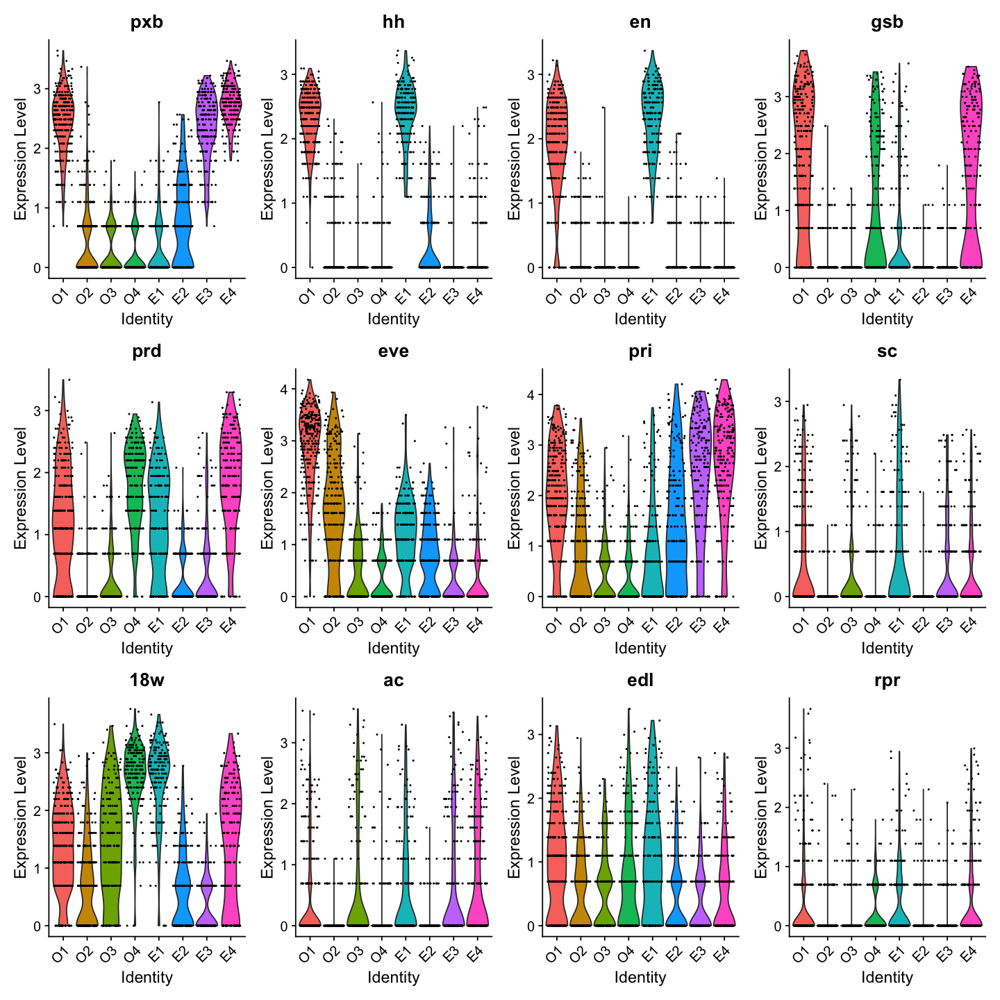

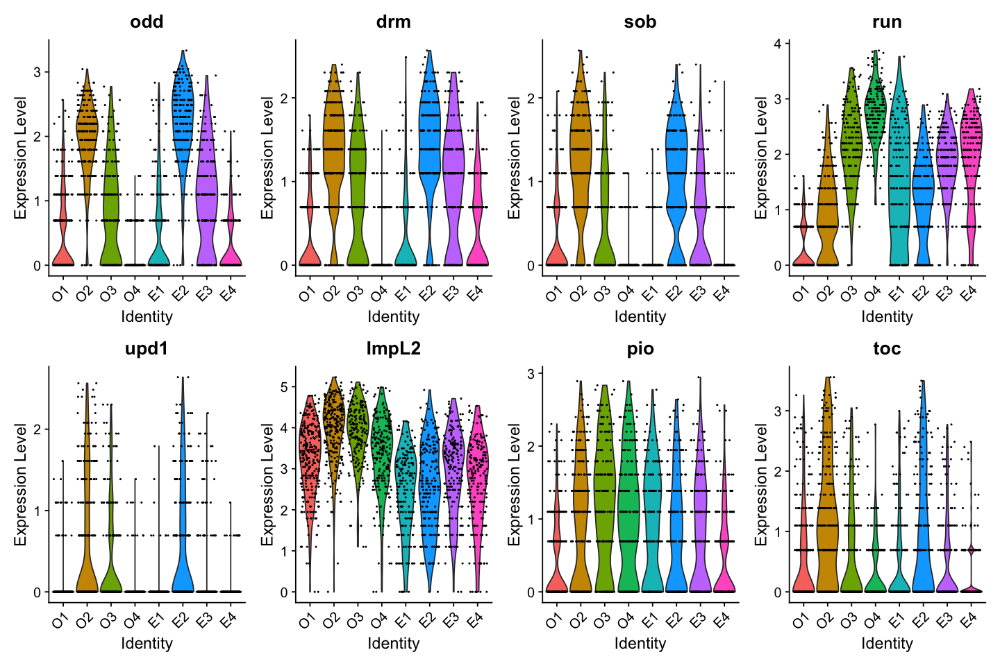

In [11]:
DE_O1vsO2 <- FindMarkers(
  seu_PR_VF3000,
  ident.1 = "O1",
  ident.2 = "O2",
  logfc.threshold = log(1.75),
  test.use = "MAST",
  verbose = TRUE,
  only.pos = FALSE,
)

DE_O1vsO2_FWER0.01_FC1.75 <- filter(DE_O1vsO2, p_val_adj <= 0.01)

compaired_ID <- rep("O1vsO2", length=nrow(DE_O1vsO2_FWER0.01_FC1.75)) 
DE_O1vsO2_FWER0.01_FC1.75 <- cbind(DE_O1vsO2_FWER0.01_FC1.75, compaired_ID)
DE_O1vsO2_FWER0.01_FC1.75

DE_O1vsO2_FWER0.01_FC1.75_plus <- filter(DE_O1vsO2, p_val_adj <= 0.01 & avg_logFC >= log(1.75) )
DE_O1vsO2_FWER0.01_FC1.75_plus
dim(DE_O1vsO2_FWER0.01_FC1.75_plus)
DE_O1vsO2_FWER0.01_FC1.75_minus <- filter(DE_O1vsO2, p_val_adj <= 0.01 & avg_logFC <= -log(1.75) )
DE_O1vsO2_FWER0.01_FC1.75_minus
dim(DE_O1vsO2_FWER0.01_FC1.75_minus)

options(repr.plot.width=12, repr.plot.height=　4*ceiling(nrow(DE_O1vsO2_FWER0.01_FC1.75_plus)/4))
"DEGs O1vsO2, avgFC >= 1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = rownames(DE_O1vsO2_FWER0.01_FC1.75_plus), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC1.75/DEGs_O1vsO2_plus_FC1.75.png", 
       width = 10.24, height = 2.56*ceiling(nrow(DE_O1vsO2_FWER0.01_FC1.75_plus)/4))

options(repr.plot.width=12, repr.plot.height=4*ceiling(nrow(DE_O1vsO2_FWER0.01_FC1.75_minus)/4))
"DEGs O1vsO2, avgFC <= -1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = rownames(DE_O1vsO2_FWER0.01_FC1.75_minus), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC1.75/DEGs_O1vsO2_minus_FC1.75.png", 
       width = 10.24, height = 2.56*ceiling(nrow(DE_O1vsO2_FWER0.01_FC1.75_minus)/4))

write.table(DE_O1vsO2_FWER0.01_FC1.75, file = "./DEG_boundary_FC1.75/DEGs_O1vsO2_FWER0.01_FC1.75.txt", 
            sep="\t", col.names=T, row.names=T, quote=F)

### O2 vs. O3


Done!

Combining coefficients and standard errors

Calculating log-fold changes

Calculating likelihood ratio tests

Refitting on reduced model...


Done!



,p_val,avg_logFC,pct.1,pct.2,p_val_adj,compaired_ID
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
mid,5.647280e-93,1.8692039,0.973,0.328,1.694184e-89,O2vsO3
slp1,9.195490e-88,-1.8903968,0.375,0.979,2.758647e-84,O2vsO3
comm,2.835547e-65,-1.5386427,0.406,0.937,8.506640e-62,O2vsO3
Tollo,1.205737e-61,0.9751762,1.000,0.963,3.617211e-58,O2vsO3
run,7.468138e-55,-1.2039556,0.713,0.989,2.240441e-51,O2vsO3
comm2,9.190187e-53,-1.0828601,0.157,0.804,2.757056e-49,O2vsO3
odd,1.214723e-49,0.9241615,0.973,0.640,3.644170e-46,O2vsO3
eve,1.876658e-31,1.3631948,0.835,0.455,5.629975e-28,O2vsO3
slp2,3.077591e-27,-0.6212664,0.046,0.466,9.232774e-24,O2vsO3


,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
mid,5.647280e-93,1.8692039,0.973,0.328,1.694184e-89
Tollo,1.205737e-61,0.9751762,1.000,0.963,3.617211e-58
odd,1.214723e-49,0.9241615,0.973,0.640,3.644170e-46
eve,1.876658e-31,1.3631948,0.835,0.455,5.629975e-28
sob,2.263492e-26,0.6437209,0.889,0.450,6.790475e-23
h,7.952535e-20,0.7781194,0.705,0.323,2.385760e-16
pri,1.129074e-10,0.7959907,0.605,0.455,3.387222e-07
toc,2.635677e-10,0.6733946,0.724,0.423,7.907030e-07
l(1)sc,1.151339e-08,0.7769475,0.770,0.598,3.454016e-05


[1] 9 5

,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
slp1,9.195490e-88,-1.8903968,0.375,0.979,2.758647e-84
comm,2.835547e-65,-1.5386427,0.406,0.937,8.506640e-62
run,7.468138e-55,-1.2039556,0.713,0.989,2.240441e-51
comm2,9.190187e-53,-1.0828601,0.157,0.804,2.757056e-49
slp2,3.077591e-27,-0.6212664,0.046,0.466,9.232774e-24
ac,3.759840e-17,-1.2212383,0.069,0.333,1.127952e-13
18w,8.447948e-17,-0.8090236,0.575,0.831,2.534384e-13
sc,1.295272e-12,-0.7737805,0.054,0.280,3.885815e-09


[1] 8 5

[1] "DEGs O2vsO3, avgFC >= 1.5, FWER <= 0.01"

[1] "DEGs O2vsO3, avgFC <= -1.5, FWER <= 0.01"

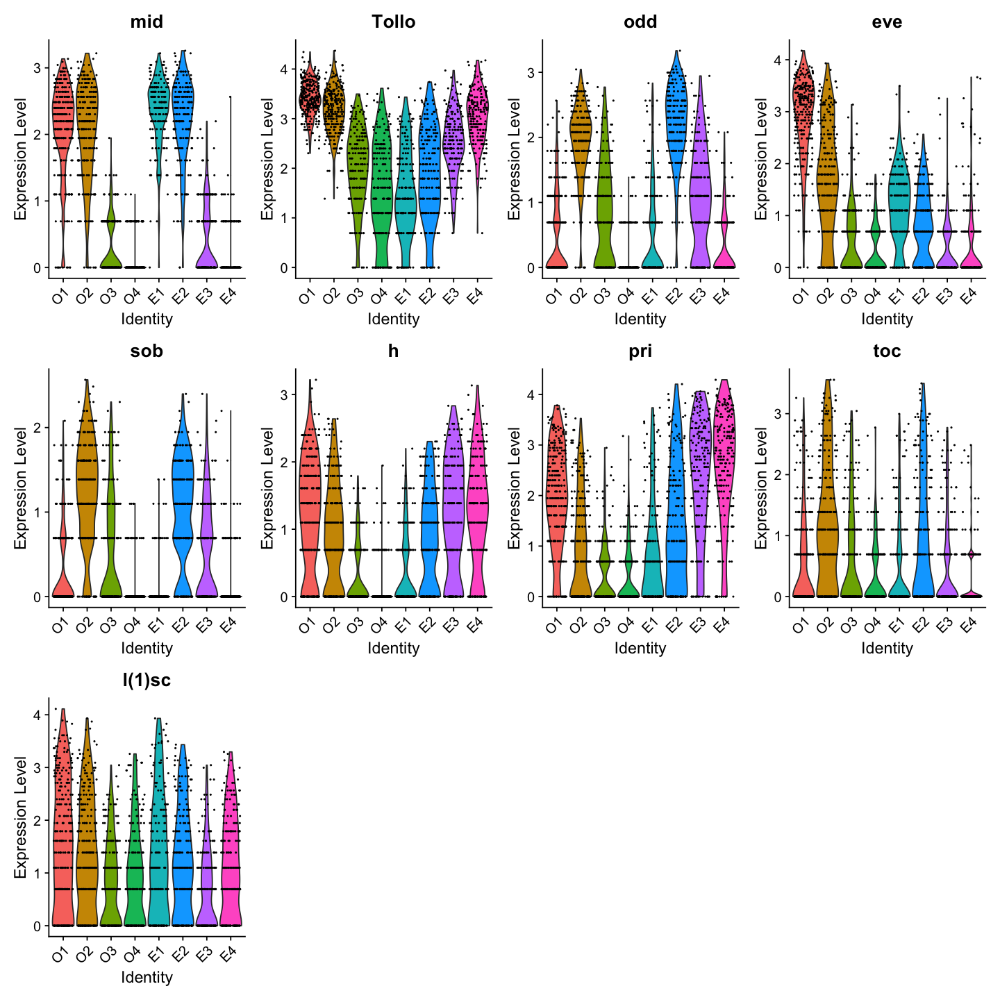

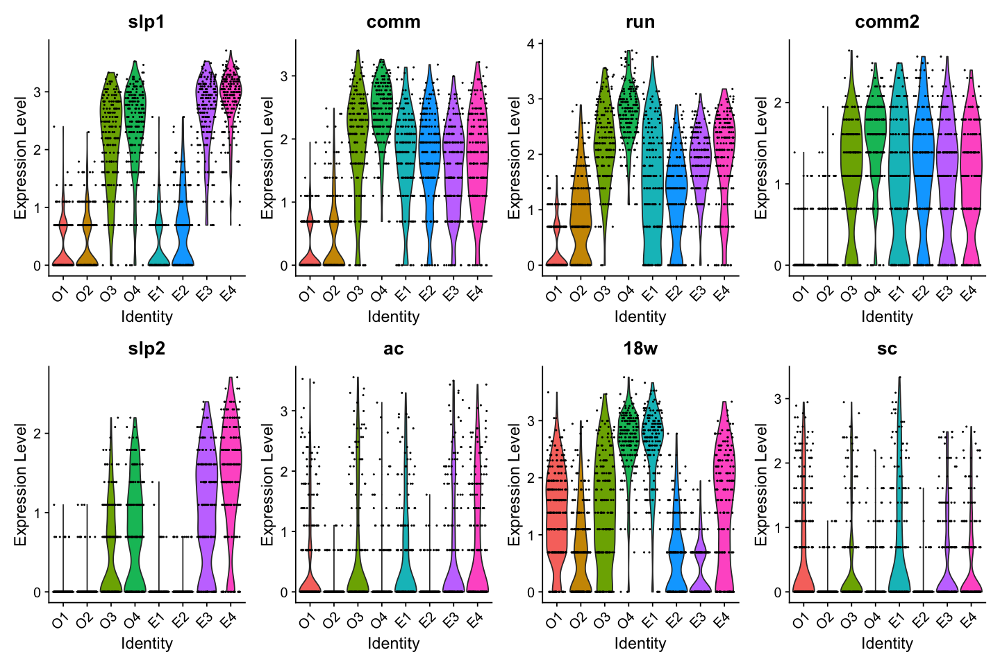

In [12]:
DE_O2vsO3 <- FindMarkers(
  seu_PR_VF3000,
  ident.1 = "O2",
  ident.2 = "O3",
  logfc.threshold = log(1.75),
  test.use = "MAST",
  verbose = TRUE,
  only.pos = FALSE,
)

DE_O2vsO3_FWER0.01_FC1.75 <- filter(DE_O2vsO3, p_val_adj <= 0.01)

compaired_ID <- rep("O2vsO3", length=nrow(DE_O2vsO3_FWER0.01_FC1.75)) 
DE_O2vsO3_FWER0.01_FC1.75 <- cbind(DE_O2vsO3_FWER0.01_FC1.75, compaired_ID)
DE_O2vsO3_FWER0.01_FC1.75

DE_O2vsO3_FWER0.01_FC1.75_plus <- filter(DE_O2vsO3, p_val_adj <= 0.01 & avg_logFC >= log(1.75) )
DE_O2vsO3_FWER0.01_FC1.75_plus
dim(DE_O2vsO3_FWER0.01_FC1.75_plus)
DE_O2vsO3_FWER0.01_FC1.75_minus <- filter(DE_O2vsO3, p_val_adj <= 0.01 & avg_logFC <= -log(1.75) )
DE_O2vsO3_FWER0.01_FC1.75_minus
dim(DE_O2vsO3_FWER0.01_FC1.75_minus)

options(repr.plot.width=12, repr.plot.height=　4*ceiling(nrow(DE_O2vsO3_FWER0.01_FC1.75_plus)/4))
"DEGs O2vsO3, avgFC >= 1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = rownames(DE_O2vsO3_FWER0.01_FC1.75_plus), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC1.75/DEGs_O2vsO3_plus_FC1.75.png", 
       width = 10.24, height = 2.56*ceiling(nrow(DE_O2vsO3_FWER0.01_FC1.75_plus)/4))

options(repr.plot.width=12, repr.plot.height=4*ceiling(nrow(DE_O2vsO3_FWER0.01_FC1.75_minus)/4))
"DEGs O2vsO3, avgFC <= -1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = rownames(DE_O2vsO3_FWER0.01_FC1.75_minus), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC1.75/DEGs_O2vsO3_minus_FC1.75.png", 
       width = 10.24, height = 2.56*ceiling(nrow(DE_O2vsO3_FWER0.01_FC1.75_minus)/4))

write.table(DE_O2vsO3_FWER0.01_FC1.75, file = "./DEG_boundary_FC1.75/DEGs_O2vsO3_FWER0.01_FC1.75.txt", 
            sep="\t", col.names=T, row.names=T, quote=F)





### O3 vs. O4


Done!

Combining coefficients and standard errors

Calculating log-fold changes

Calculating likelihood ratio tests

Refitting on reduced model...


Done!



,p_val,avg_logFC,pct.1,pct.2,p_val_adj,compaired_ID
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
wg,1.951928e-93,-1.6936622,0.460,0.995,5.855784e-90,O3vsO4
prd,3.984186e-68,-1.5243313,0.280,0.966,1.195256e-64,O3vsO4
18w,3.658259e-41,-0.8939046,0.831,0.985,1.097478e-37,O3vsO4
gsb,3.799816e-29,-1.7263327,0.085,0.554,1.139945e-25,O3vsO4
odd,1.064627e-23,0.8996675,0.640,0.230,3.193880e-20,O3vsO4
drm,9.647397e-23,0.7310539,0.640,0.201,2.894219e-19,O3vsO4
sob,6.400709e-16,0.6267494,0.450,0.123,1.920213e-12,O3vsO4
upd1,1.023120e-13,0.6006216,0.349,0.059,3.069359e-10,O3vsO4
toc,2.259213e-06,0.5688495,0.423,0.324,6.777640e-03,O3vsO4


,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
odd,1.064627e-23,0.8996675,0.640,0.230,3.193880e-20
drm,9.647397e-23,0.7310539,0.640,0.201,2.894219e-19
sob,6.400709e-16,0.6267494,0.450,0.123,1.920213e-12
upd1,1.023120e-13,0.6006216,0.349,0.059,3.069359e-10
toc,2.259213e-06,0.5688495,0.423,0.324,6.777640e-03


[1] 5 5

,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
wg,1.951928e-93,-1.6936622,0.460,0.995,5.855784e-90
prd,3.984186e-68,-1.5243313,0.280,0.966,1.195256e-64
18w,3.658259e-41,-0.8939046,0.831,0.985,1.097478e-37
gsb,3.799816e-29,-1.7263327,0.085,0.554,1.139945e-25


[1] 4 5

[1] "DEGs O3vsO4, avgFC >= 1.5, FWER <= 0.01"

[1] "DEGs O3vsO4, avgFC <= -1.5, FWER <= 0.01"

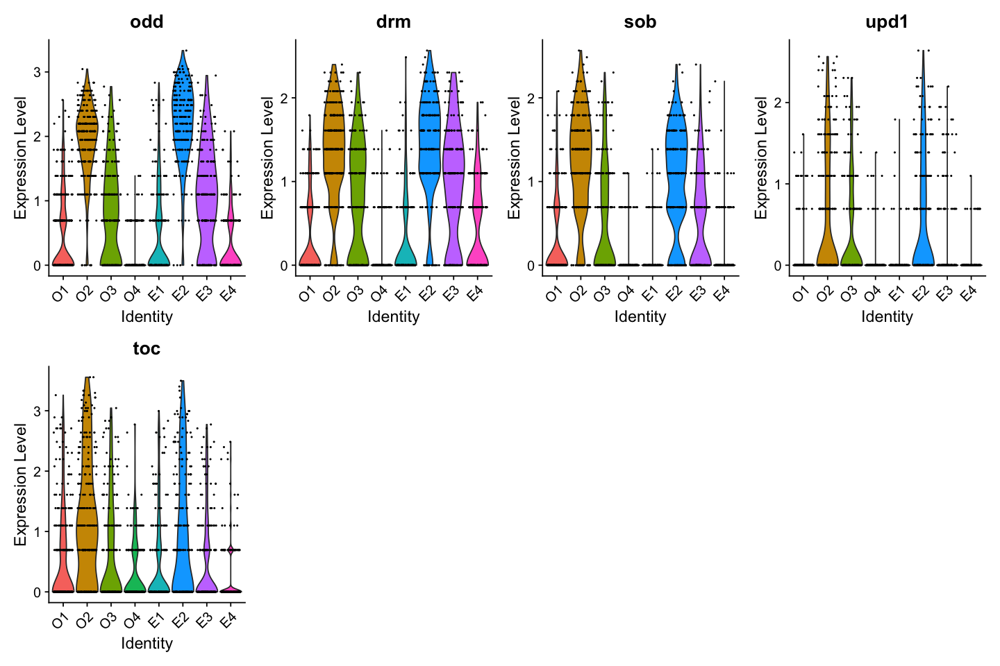

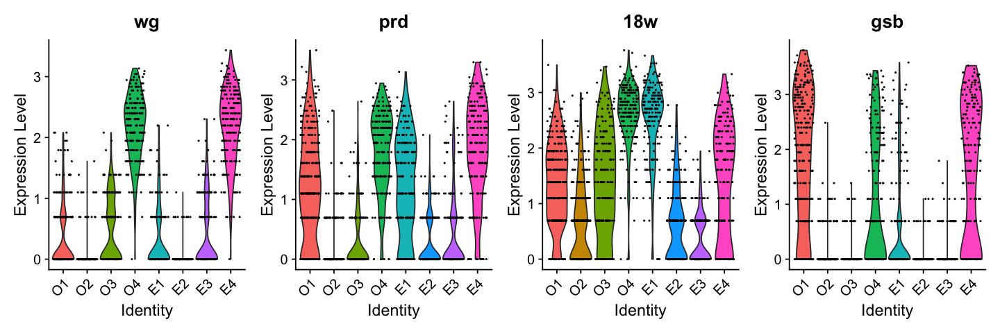

In [13]:
DE_O3vsO4 <- FindMarkers(
  seu_PR_VF3000,
  ident.1 = "O3",
  ident.2 = "O4",
  logfc.threshold = log(1.75),
  test.use = "MAST",
  verbose = TRUE,
  only.pos = FALSE,
)

DE_O3vsO4_FWER0.01_FC1.75 <- filter(DE_O3vsO4, p_val_adj <= 0.01)

compaired_ID <- rep("O3vsO4", length=nrow(DE_O3vsO4_FWER0.01_FC1.75)) 
DE_O3vsO4_FWER0.01_FC1.75 <- cbind(DE_O3vsO4_FWER0.01_FC1.75, compaired_ID)
DE_O3vsO4_FWER0.01_FC1.75

DE_O3vsO4_FWER0.01_FC1.75_plus <- filter(DE_O3vsO4, p_val_adj <= 0.01 & avg_logFC >= log(1.75) )
DE_O3vsO4_FWER0.01_FC1.75_plus
dim(DE_O3vsO4_FWER0.01_FC1.75_plus)
DE_O3vsO4_FWER0.01_FC1.75_minus <- filter(DE_O3vsO4, p_val_adj <= 0.01 & avg_logFC <= -log(1.75) )
DE_O3vsO4_FWER0.01_FC1.75_minus
dim(DE_O3vsO4_FWER0.01_FC1.75_minus)

options(repr.plot.width=12, repr.plot.height=　4*ceiling(nrow(DE_O3vsO4_FWER0.01_FC1.75_plus)/4))
"DEGs O3vsO4, avgFC >= 1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = rownames(DE_O3vsO4_FWER0.01_FC1.75_plus), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC1.75/DEGs_O3vsO4_plus_FC1.75.png", 
       width = 10.24, height = 2.56*ceiling(nrow(DE_O3vsO4_FWER0.01_FC1.75_plus)/4))

options(repr.plot.width=12, repr.plot.height=4*ceiling(nrow(DE_O3vsO4_FWER0.01_FC1.75_minus)/4))
"DEGs O3vsO4, avgFC <= -1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = rownames(DE_O3vsO4_FWER0.01_FC1.75_minus), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC1.75/DEGs_O3vsO4_minus_FC1.75.png", 
       width = 10.24, height = 2.56*ceiling(nrow(DE_O3vsO4_FWER0.01_FC1.75_minus)/4))

write.table(DE_O3vsO4_FWER0.01_FC1.75, file = "./DEG_boundary_FC1.75/DEGs_O3vsO4_FWER0.01_FC1.75.txt", 
            sep="\t", col.names=T, row.names=T, quote=F)


### O4 vs. E1


Done!

Combining coefficients and standard errors

Calculating log-fold changes

Calculating likelihood ratio tests

Refitting on reduced model...


Done!



,p_val,avg_logFC,pct.1,pct.2,p_val_adj,compaired_ID
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
trn,2.483738e-127,-2.2536809,0.877,1.000,7.451214e-124,O4vsE1
ftz,1.111536e-122,-2.4214492,0.338,1.000,3.334608e-119,O4vsE1
mid,2.362656e-120,-2.2825225,0.176,0.994,7.087967e-117,O4vsE1
en,3.982940e-113,-2.3207477,0.127,1.000,1.194882e-109,O4vsE1
hh,5.690920e-106,-2.1910646,0.142,1.000,1.707276e-102,O4vsE1
slp1,3.924359e-91,2.1339860,0.975,0.328,1.177308e-87,O4vsE1
wg,4.459239e-89,1.8132560,0.995,0.294,1.337772e-85,O4vsE1
Toll-6,1.345710e-71,1.9469813,0.961,0.712,4.037131e-68,O4vsE1
run,3.269111e-45,0.9549355,1.000,0.808,9.807332e-42,O4vsE1


,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
slp1,3.924359e-91,2.1339860,0.975,0.328,1.177308e-87
wg,4.459239e-89,1.8132560,0.995,0.294,1.337772e-85
Toll-6,1.345710e-71,1.9469813,0.961,0.712,4.037131e-68
run,3.269111e-45,0.9549355,1.000,0.808,9.807332e-42
slp2,2.139859e-37,0.9004169,0.642,0.051,6.419576e-34
ich,7.676915e-27,1.2632079,0.853,0.525,2.303074e-23
comm,3.805549e-26,0.5932083,1.000,0.938,1.141665e-22
ImpL2,1.025559e-18,0.8402441,0.990,0.966,3.076678e-15
Abd-B,3.330184e-13,2.1387699,0.294,0.090,9.990552e-10


[1] 12  5

,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
trn,2.483738e-127,-2.2536809,0.877,1.000,7.451214e-124
ftz,1.111536e-122,-2.4214492,0.338,1.000,3.334608e-119
mid,2.362656e-120,-2.2825225,0.176,0.994,7.087967e-117
en,3.982940e-113,-2.3207477,0.127,1.000,1.194882e-109
hh,5.690920e-106,-2.1910646,0.142,1.000,1.707276e-102
eve,1.161272e-31,-0.9897103,0.377,0.853,3.483817e-28
blot,4.035165e-23,-0.6717000,0.917,0.994,1.210549e-19
CG4702,3.074882e-22,-1.2931199,0.152,0.554,9.224645e-19
5-HT2A,2.236505e-17,-0.7292494,0.554,0.774,6.709514e-14


[1] 14  5

[1] "DEGs O4vsE1, avgFC >= 1.5, FWER <= 0.01"

[1] "DEGs O4vsE1, avgFC <= -1.5, FWER <= 0.01"

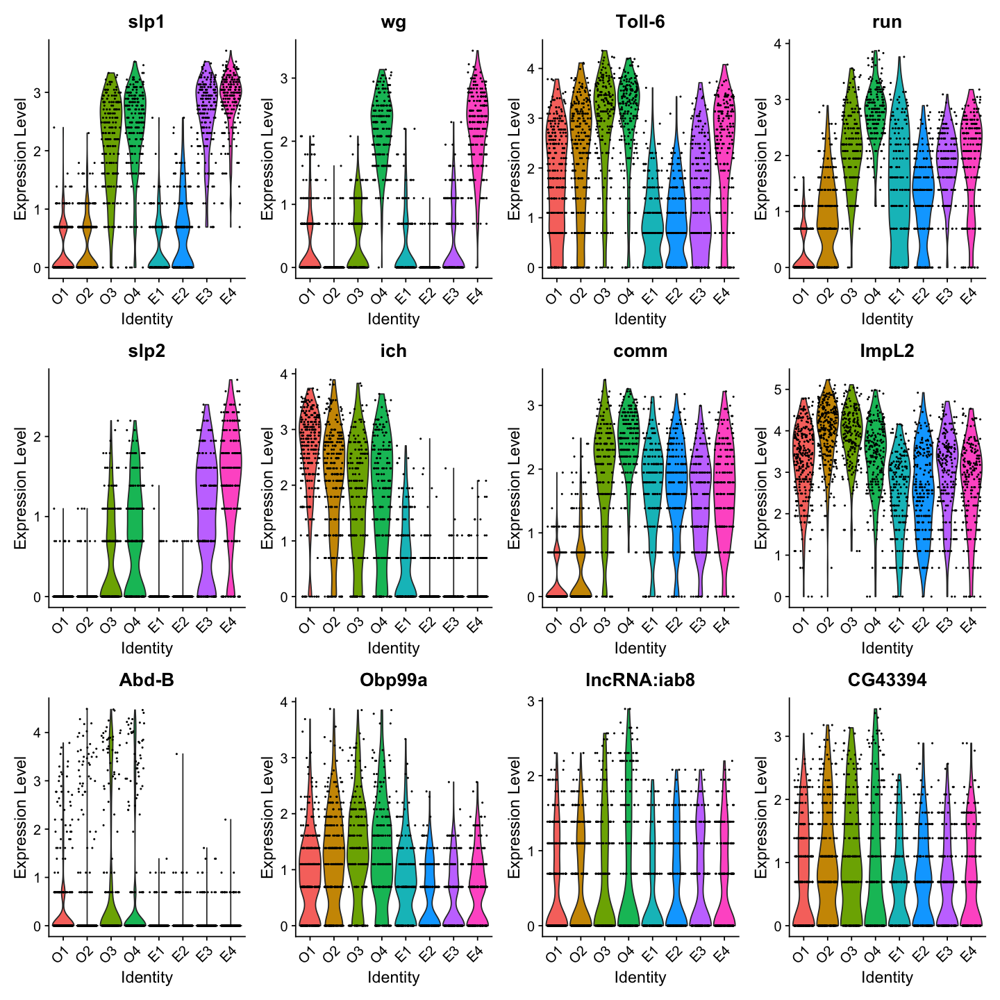

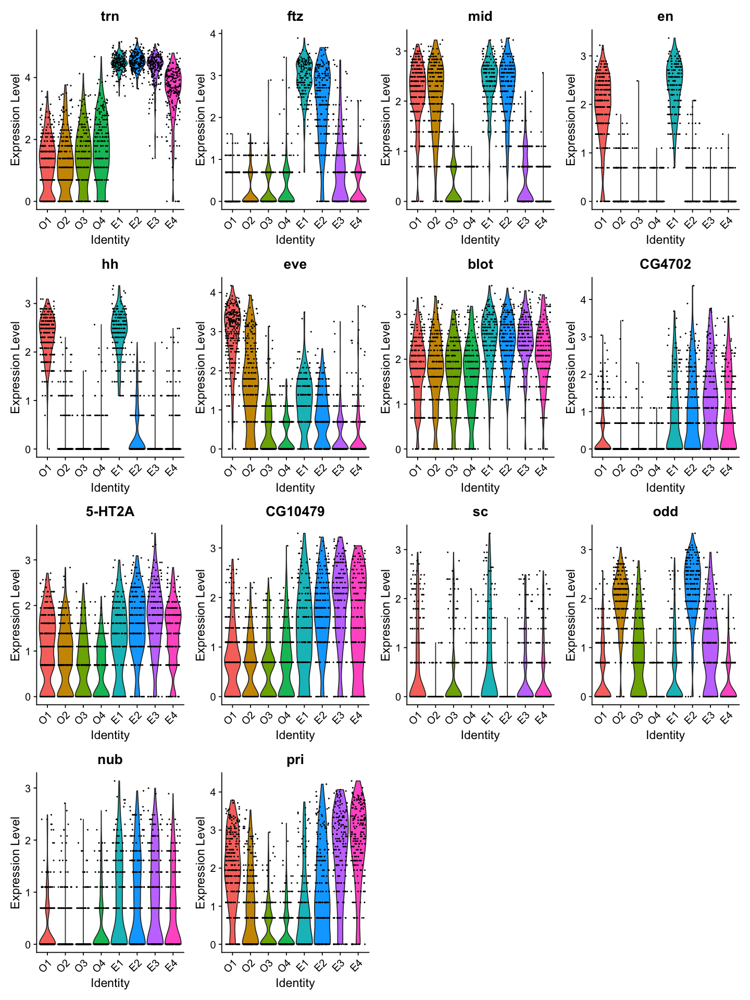

In [14]:
DE_O4vsE1 <- FindMarkers(
  seu_PR_VF3000,
  ident.1 = "O4",
  ident.2 = "E1",
  logfc.threshold = log(1.75),
  test.use = "MAST",
  verbose = TRUE,
  only.pos = FALSE,
)

DE_O4vsE1_FWER0.01_FC1.75 <- filter(DE_O4vsE1, p_val_adj <= 0.01)

compaired_ID <- rep("O4vsE1", length=nrow(DE_O4vsE1_FWER0.01_FC1.75)) 
DE_O4vsE1_FWER0.01_FC1.75 <- cbind(DE_O4vsE1_FWER0.01_FC1.75, compaired_ID)
DE_O4vsE1_FWER0.01_FC1.75

DE_O4vsE1_FWER0.01_FC1.75_plus <- filter(DE_O4vsE1, p_val_adj <= 0.01 & avg_logFC >= log(1.75) )
DE_O4vsE1_FWER0.01_FC1.75_plus
dim(DE_O4vsE1_FWER0.01_FC1.75_plus)
DE_O4vsE1_FWER0.01_FC1.75_minus <- filter(DE_O4vsE1, p_val_adj <= 0.01 & avg_logFC <= -log(1.75) )
DE_O4vsE1_FWER0.01_FC1.75_minus
dim(DE_O4vsE1_FWER0.01_FC1.75_minus)

options(repr.plot.width=12, repr.plot.height=　4*ceiling(nrow(DE_O4vsE1_FWER0.01_FC1.75_plus)/4))
"DEGs O4vsE1, avgFC >= 1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = rownames(DE_O4vsE1_FWER0.01_FC1.75_plus), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC1.75/DEGs_O4vsE1_plus_FC1.75.png", 
       width = 10.24, height = 2.56*ceiling(nrow(DE_O4vsE1_FWER0.01_FC1.75_plus)/4))

options(repr.plot.width=12, repr.plot.height=4*ceiling(nrow(DE_O4vsE1_FWER0.01_FC1.75_minus)/4))
"DEGs O4vsE1, avgFC <= -1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = rownames(DE_O4vsE1_FWER0.01_FC1.75_minus), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC1.75/DEGs_O4vsE1_minus_FC1.75.png", 
       width = 10.24, height = 2.56*ceiling(nrow(DE_O4vsE1_FWER0.01_FC1.75_minus)/4))

write.table(DE_O4vsE1_FWER0.01_FC1.75, file = "./DEG_boundary_FC1.75/DEGs_O4vsE1_FWER0.01_FC1.75.txt", 
            sep="\t", col.names=T, row.names=T, quote=F)


### E1 vs. E2


Done!

Combining coefficients and standard errors

Calculating log-fold changes

Calculating likelihood ratio tests

Refitting on reduced model...


Done!



,p_val,avg_logFC,pct.1,pct.2,p_val_adj,compaired_ID
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
hh,1.018802e-102,1.9717408,1.000,0.310,3.056407e-99,E1vsE2
en,1.786367e-93,1.9836999,1.000,0.241,5.359100e-90,E1vsE2
18w,4.073161e-81,1.7874755,0.977,0.567,1.221948e-77,E1vsE2
odd,4.177896e-67,-1.4984804,0.412,0.980,1.253369e-63,E1vsE2
drm,2.097802e-51,-1.1238951,0.277,0.921,6.293406e-48,E1vsE2
sob,1.110500e-46,-1.0303331,0.119,0.803,3.331500e-43,E1vsE2
prd,3.774389e-34,1.1791164,0.791,0.296,1.132317e-30,E1vsE2
sc,3.796568e-23,1.2137241,0.441,0.039,1.138970e-19,E1vsE2
dpn,2.515552e-22,-0.9081210,0.085,0.522,7.546657e-19,E1vsE2


,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
hh,1.018802e-102,1.9717408,1.000,0.310,3.056407e-99
en,1.786367e-93,1.9836999,1.000,0.241,5.359100e-90
18w,4.073161e-81,1.7874755,0.977,0.567,1.221948e-77
prd,3.774389e-34,1.1791164,0.791,0.296,1.132317e-30
sc,3.796568e-23,1.2137241,0.441,0.039,1.138970e-19
Sema5c,2.970466e-17,0.6469176,0.836,0.567,8.911399e-14
gsb,5.463964e-15,1.2265776,0.367,0.074,1.639189e-11
ac,6.679623e-15,0.9592805,0.390,0.079,2.003887e-11
halo,3.097731e-14,0.8683033,0.802,0.576,9.293193e-11


[1] 11  5

,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
odd,4.177896e-67,-1.4984804,0.412,0.980,1.253369e-63
drm,2.097802e-51,-1.1238951,0.277,0.921,6.293406e-48
sob,1.110500e-46,-1.0303331,0.119,0.803,3.331500e-43
dpn,2.515552e-22,-0.9081210,0.085,0.522,7.546657e-19
upd1,8.425061e-19,-0.8048113,0.051,0.424,2.527518e-15
dally,1.004364e-18,-0.6306133,0.751,0.916,3.013093e-15
pxb,4.241951e-11,-0.5768529,0.328,0.635,1.272585e-07


[1] 7 5

[1] "DEGs E1vsE2, avgFC >= 1.5, FWER <= 0.01"

[1] "DEGs E1vsE2, avgFC <= -1.5, FWER <= 0.01"

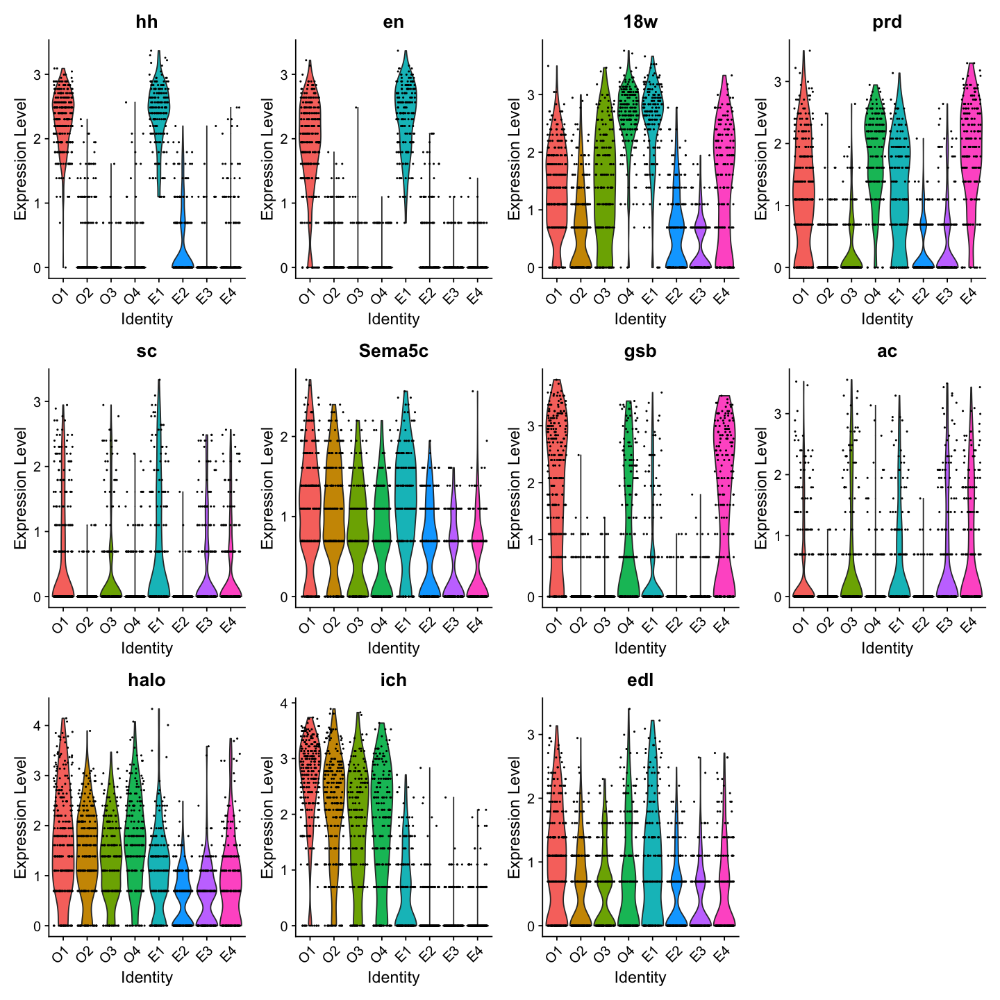

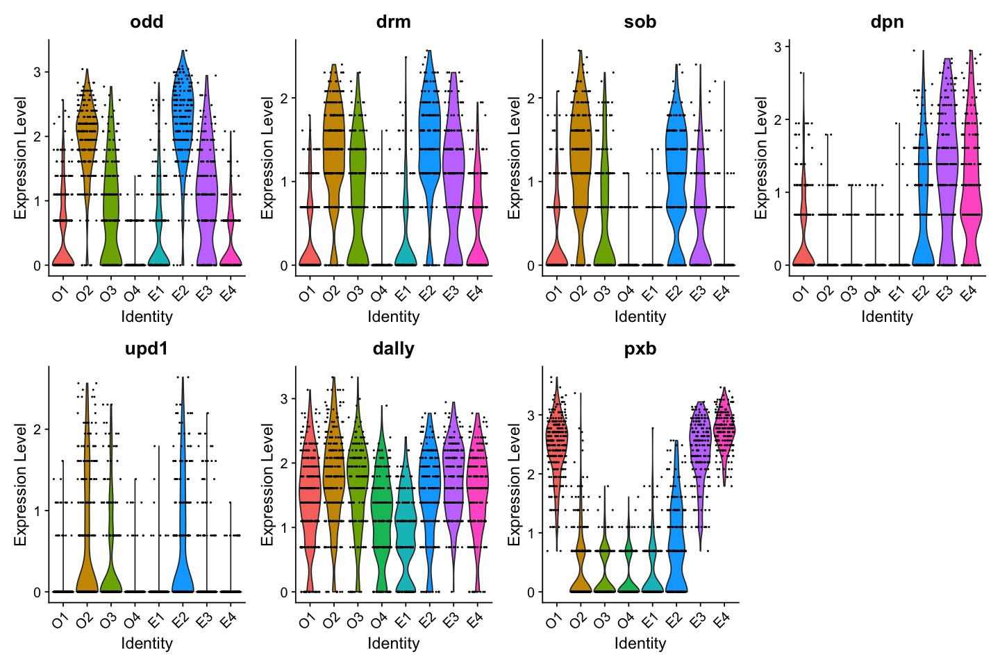

In [15]:
DE_E1vsE2 <- FindMarkers(
  seu_PR_VF3000,
  ident.1 = "E1",
  ident.2 = "E2",
  logfc.threshold = log(1.75),
  test.use = "MAST",
  verbose = TRUE,
  only.pos = FALSE,
)

DE_E1vsE2_FWER0.01_FC1.75 <- filter(DE_E1vsE2, p_val_adj <= 0.01)

compaired_ID <- rep("E1vsE2", length=nrow(DE_E1vsE2_FWER0.01_FC1.75)) 
DE_E1vsE2_FWER0.01_FC1.75 <- cbind(DE_E1vsE2_FWER0.01_FC1.75, compaired_ID)
DE_E1vsE2_FWER0.01_FC1.75

DE_E1vsE2_FWER0.01_FC1.75_plus <- filter(DE_E1vsE2, p_val_adj <= 0.01 & avg_logFC >= log(1.75) )
DE_E1vsE2_FWER0.01_FC1.75_plus
dim(DE_E1vsE2_FWER0.01_FC1.75_plus)
DE_E1vsE2_FWER0.01_FC1.75_minus <- filter(DE_E1vsE2, p_val_adj <= 0.01 & avg_logFC <= -log(1.75) )
DE_E1vsE2_FWER0.01_FC1.75_minus
dim(DE_E1vsE2_FWER0.01_FC1.75_minus)

options(repr.plot.width=12, repr.plot.height=　4*ceiling(nrow(DE_E1vsE2_FWER0.01_FC1.75_plus)/4))
"DEGs E1vsE2, avgFC >= 1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = rownames(DE_E1vsE2_FWER0.01_FC1.75_plus), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC1.75/DEGs_E1vsE2_plus_FC1.75.png", 
       width = 10.24, height = 2.56*ceiling(nrow(DE_E1vsE2_FWER0.01_FC1.75_plus)/4))

options(repr.plot.width=12, repr.plot.height=4*ceiling(nrow(DE_E1vsE2_FWER0.01_FC1.75_minus)/4))
"DEGs E1vsE2, avgFC <= -1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = rownames(DE_E1vsE2_FWER0.01_FC1.75_minus), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC1.75/DEGs_E1vsE2_minus_FC1.75.png", 
       width = 10.24, height = 2.56*ceiling(nrow(DE_E1vsE2_FWER0.01_FC1.75_minus)/4))

write.table(DE_E1vsE2_FWER0.01_FC1.75, file = "./DEG_boundary_FC1.75/DEGs_E1vsE2_FWER0.01_FC1.75.txt", 
            sep="\t", col.names=T, row.names=T, quote=F)


### E2 vs. E3


Done!

Combining coefficients and standard errors

Calculating log-fold changes

Calculating likelihood ratio tests

Refitting on reduced model...


Done!



,p_val,avg_logFC,pct.1,pct.2,p_val_adj,compaired_ID
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
slp1,4.875810e-94,-1.9426847,0.542,1.000,1.462743e-90,E2vsE3
mid,2.686522e-87,1.7859648,0.990,0.397,8.059566e-84,E2vsE3
pxb,3.580290e-76,-1.4329256,0.635,1.000,1.074087e-72,E2vsE3
slp2,9.788191e-55,-1.1894225,0.059,0.763,2.936457e-51,E2vsE3
odd,3.326921e-46,1.0223651,0.980,0.742,9.980762e-43,E2vsE3
ftz,4.404201e-43,1.3818315,0.936,0.567,1.321260e-39,E2vsE3
Alh,5.352056e-18,-0.6218773,0.739,0.918,1.605617e-14,E2vsE3
sc,6.398161e-17,-0.7727841,0.039,0.356,1.919448e-13,E2vsE3
ac,1.467051e-15,-1.1959198,0.079,0.366,4.401153e-12,E2vsE3


,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
mid,2.686522e-87,1.7859648,0.990,0.397,8.059566e-84
odd,3.326921e-46,1.0223651,0.980,0.742,9.980762e-43
ftz,4.404201e-43,1.3818315,0.936,0.567,1.321260e-39
l(1)sc,3.381626e-07,0.6504984,0.724,0.541,1.014488e-03


[1] 4 5

,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
slp1,4.875810e-94,-1.9426847,0.542,1.000,1.462743e-90
pxb,3.580290e-76,-1.4329256,0.635,1.000,1.074087e-72
slp2,9.788191e-55,-1.1894225,0.059,0.763,2.936457e-51
Alh,5.352056e-18,-0.6218773,0.739,0.918,1.605617e-14
sc,6.398161e-17,-0.7727841,0.039,0.356,1.919448e-13
ac,1.467051e-15,-1.1959198,0.079,0.366,4.401153e-12
pri,2.640313e-12,-0.6856348,0.754,0.912,7.920939e-09
Toll-6,8.860054e-10,-0.7607490,0.714,0.840,2.658016e-06


[1] 8 5

[1] "DEGs E2vsE3, avgFC >= 1.5, FWER <= 0.01"

[1] "DEGs E2vsE3, avgFC <= -1.5, FWER <= 0.01"

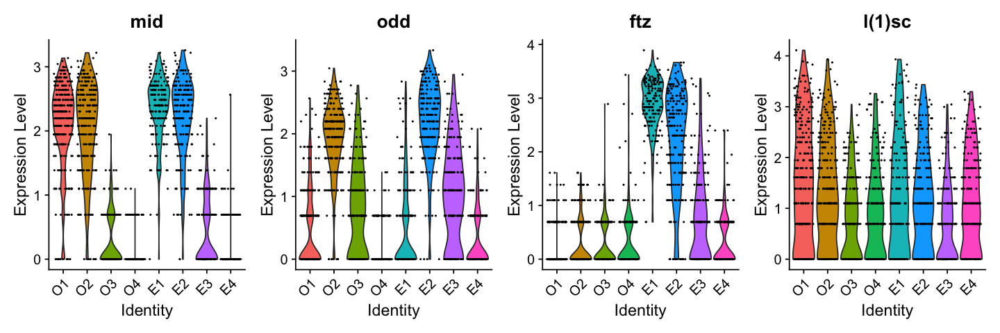

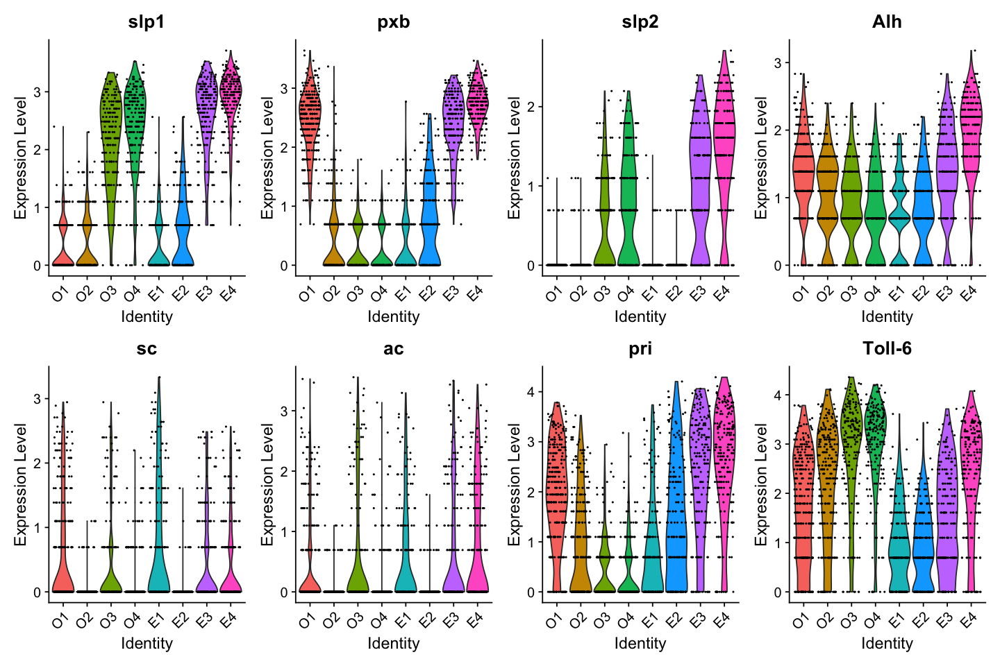

In [16]:
DE_E2vsE3 <- FindMarkers(
  seu_PR_VF3000,
  ident.1 = "E2",
  ident.2 = "E3",
  logfc.threshold = log(1.75),
  test.use = "MAST",
  verbose = TRUE,
  only.pos = FALSE,
)

DE_E2vsE3_FWER0.01_FC1.75 <- filter(DE_E2vsE3, p_val_adj <= 0.01)

compaired_ID <- rep("E2vsE3", length=nrow(DE_E2vsE3_FWER0.01_FC1.75)) 
DE_E2vsE3_FWER0.01_FC1.75 <- cbind(DE_E2vsE3_FWER0.01_FC1.75, compaired_ID)
DE_E2vsE3_FWER0.01_FC1.75

DE_E2vsE3_FWER0.01_FC1.75_plus <- filter(DE_E2vsE3, p_val_adj <= 0.01 & avg_logFC >= log(1.75) )
DE_E2vsE3_FWER0.01_FC1.75_plus
dim(DE_E2vsE3_FWER0.01_FC1.75_plus)
DE_E2vsE3_FWER0.01_FC1.75_minus <- filter(DE_E2vsE3, p_val_adj <= 0.01 & avg_logFC <= -log(1.75) )
DE_E2vsE3_FWER0.01_FC1.75_minus
dim(DE_E2vsE3_FWER0.01_FC1.75_minus)

options(repr.plot.width=12, repr.plot.height=　4*ceiling(nrow(DE_E2vsE3_FWER0.01_FC1.75_plus)/4))
"DEGs E2vsE3, avgFC >= 1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = rownames(DE_E2vsE3_FWER0.01_FC1.75_plus), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC1.75/DEGs_E2vsE3_plus_FC1.75.png", 
       width = 10.24, height = 2.56*ceiling(nrow(DE_E2vsE3_FWER0.01_FC1.75_plus)/4))

options(repr.plot.width=12, repr.plot.height=4*ceiling(nrow(DE_E2vsE3_FWER0.01_FC1.75_minus)/4))
"DEGs E2vsE3, avgFC <= -1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = rownames(DE_E2vsE3_FWER0.01_FC1.75_minus), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC1.75/DEGs_E2vsE3_minus_FC1.75.png", 
       width = 10.24, height = 2.56*ceiling(nrow(DE_E2vsE3_FWER0.01_FC1.75_minus)/4))

write.table(DE_E2vsE3_FWER0.01_FC1.75, file = "./DEG_boundary_FC1.75/DEGs_E2vsE3_FWER0.01_FC1.75.txt", 
            sep="\t", col.names=T, row.names=T, quote=F)

### E3 vs. E4


Done!

Combining coefficients and standard errors

Calculating log-fold changes

Calculating likelihood ratio tests

Refitting on reduced model...


Done!



,p_val,avg_logFC,pct.1,pct.2,p_val_adj,compaired_ID
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
wg,5.936337e-84,-1.7587676,0.351,0.995,1.780901e-80,E3vsE4
prd,1.597670e-50,-1.3874514,0.361,0.941,4.793010e-47,E3vsE4
gsb,7.756052e-46,-2.0994310,0.113,0.691,2.326816e-42,E3vsE4
18w,4.594458e-36,-1.3666112,0.418,0.760,1.378337e-32,E3vsE4
trn,3.830402e-26,0.6601700,1.000,0.975,1.149120e-22,E3vsE4
odd,9.232189e-24,0.8930286,0.742,0.304,2.769657e-20,E3vsE4
drm,1.070542e-14,0.5829492,0.742,0.456,3.211627e-11,E3vsE4
Toll-6,1.245404e-13,-0.6856312,0.840,0.902,3.736213e-10,E3vsE4
Notum,1.485058e-12,-0.6450382,0.149,0.426,4.455173e-09,E3vsE4


,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
trn,3.830402e-26,0.6601700,1.000,0.975,1.149120e-22
odd,9.232189e-24,0.8930286,0.742,0.304,2.769657e-20
drm,1.070542e-14,0.5829492,0.742,0.456,3.211627e-11
ftz,6.145176e-09,0.7108732,0.567,0.353,1.843553e-05


[1] 4 5

,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
wg,5.936337e-84,-1.7587676,0.351,0.995,1.780901e-80
prd,1.597670e-50,-1.3874514,0.361,0.941,4.793010e-47
gsb,7.756052e-46,-2.0994310,0.113,0.691,2.326816e-42
18w,4.594458e-36,-1.3666112,0.418,0.760,1.378337e-32
Toll-6,1.245404e-13,-0.6856312,0.840,0.902,3.736213e-10
Notum,1.485058e-12,-0.6450382,0.149,0.426,4.455173e-09


[1] 6 5

[1] "DEGs E3vsE4, avgFC >= 1.5, FWER <= 0.01"

[1] "DEGs E3vsE4, avgFC <= -1.5, FWER <= 0.01"

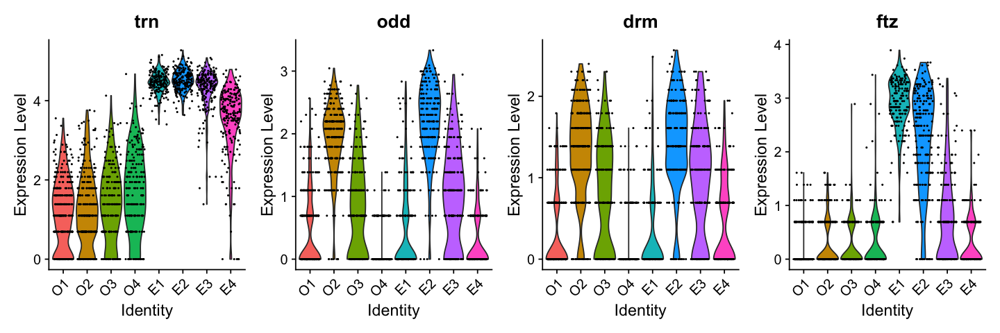

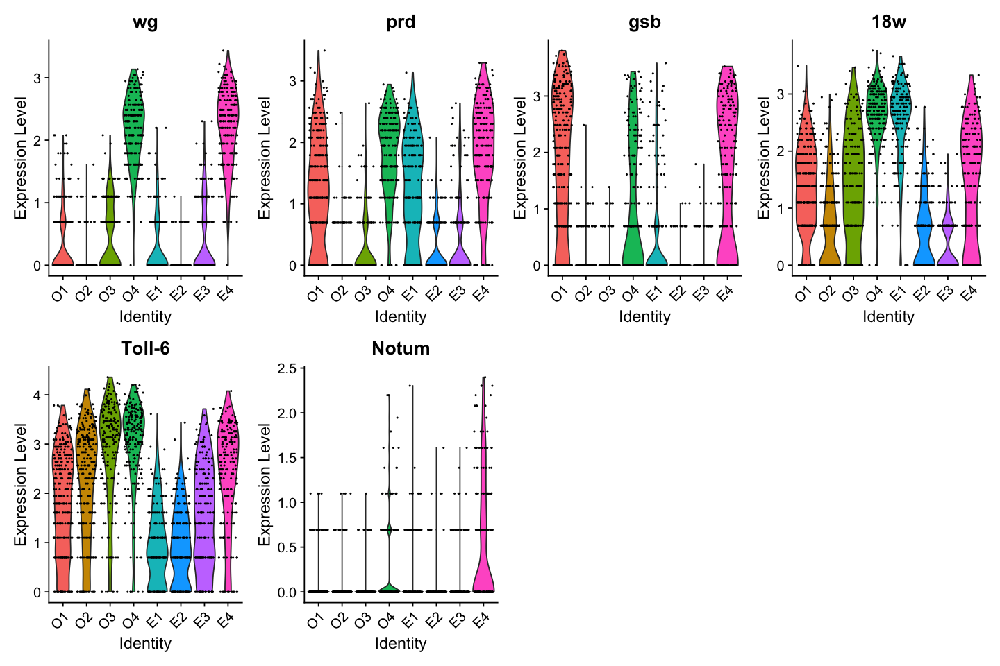

In [17]:
DE_E3vsE4 <- FindMarkers(
  seu_PR_VF3000,
  ident.1 = "E3",
  ident.2 = "E4",
  logfc.threshold = log(1.75),
  test.use = "MAST",
  verbose = TRUE,
  only.pos = FALSE,
)

DE_E3vsE4_FWER0.01_FC1.75 <- filter(DE_E3vsE4, p_val_adj <= 0.01)

compaired_ID <- rep("E3vsE4", length=nrow(DE_E3vsE4_FWER0.01_FC1.75)) 
DE_E3vsE4_FWER0.01_FC1.75 <- cbind(DE_E3vsE4_FWER0.01_FC1.75, compaired_ID)
DE_E3vsE4_FWER0.01_FC1.75

DE_E3vsE4_FWER0.01_FC1.75_plus <- filter(DE_E3vsE4, p_val_adj <= 0.01 & avg_logFC >= log(1.75) )
DE_E3vsE4_FWER0.01_FC1.75_plus
dim(DE_E3vsE4_FWER0.01_FC1.75_plus)
DE_E3vsE4_FWER0.01_FC1.75_minus <- filter(DE_E3vsE4, p_val_adj <= 0.01 & avg_logFC <= -log(1.75) )
DE_E3vsE4_FWER0.01_FC1.75_minus
dim(DE_E3vsE4_FWER0.01_FC1.75_minus)

options(repr.plot.width=12, repr.plot.height=　4*ceiling(nrow(DE_E3vsE4_FWER0.01_FC1.75_plus)/4))
"DEGs E3vsE4, avgFC >= 1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = rownames(DE_E3vsE4_FWER0.01_FC1.75_plus), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC1.75/DEGs_E3vsE4_plus_FC1.75.png", 
       width = 10.24, height = 2.56*ceiling(nrow(DE_E3vsE4_FWER0.01_FC1.75_plus)/4))

options(repr.plot.width=12, repr.plot.height=4*ceiling(nrow(DE_E3vsE4_FWER0.01_FC1.75_minus)/4))
"DEGs E3vsE4, avgFC <= -1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = rownames(DE_E3vsE4_FWER0.01_FC1.75_minus), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC1.75/DEGs_E3vsE4_minus_FC1.75.png", 
       width = 10.24, height = 2.56*ceiling(nrow(DE_E3vsE4_FWER0.01_FC1.75_minus)/4))

write.table(DE_E3vsE4_FWER0.01_FC1.75, file = "./DEG_boundary_FC1.75/DEGs_E3vsE4_FWER0.01_FC1.75.txt", 
            sep="\t", col.names=T, row.names=T, quote=F)

### E4 vs. O1


Done!

Combining coefficients and standard errors

Calculating log-fold changes

Calculating likelihood ratio tests

Refitting on reduced model...


Done!



,p_val,avg_logFC,pct.1,pct.2,p_val_adj,compaired_ID
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
slp1,1.148914e-171,2.5659038,1.000,0.330,3.446743e-168,E4vsO1
hh,1.880677e-121,-1.8634974,0.225,0.996,5.642031e-118,E4vsO1
ich,7.387463e-115,-2.4331218,0.230,0.954,2.216239e-111,E4vsO1
mid,2.919296e-114,-2.0161072,0.201,0.965,8.757888e-111,E4vsO1
wg,4.815722e-110,1.8814691,0.995,0.309,1.444717e-106,E4vsO1
trn,8.532238e-109,2.1663945,0.975,0.751,2.559671e-105,E4vsO1
en,7.843312e-108,-2.0030020,0.088,0.944,2.352993e-104,E4vsO1
eve,1.170265e-106,-2.1640382,0.328,0.989,3.510794e-103,E4vsO1
slp2,8.453789e-98,1.5967384,0.882,0.035,2.536137e-94,E4vsO1


,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
slp1,1.148914e-171,2.5659038,1.000,0.330,3.446743e-168
wg,4.815722e-110,1.8814691,0.995,0.309,1.444717e-106
trn,8.532238e-109,2.1663945,0.975,0.751,2.559671e-105
slp2,8.453789e-98,1.5967384,0.882,0.035,2.536137e-94
comm,1.145706e-84,1.6374827,0.951,0.253,3.437118e-81
run,1.538262e-84,1.7671281,0.941,0.302,4.614785e-81
comm2,6.026178e-66,1.1155854,0.794,0.084,1.807853e-62
dpn,2.326871e-27,0.8640247,0.789,0.340,6.980612e-24
Notum,5.997481e-23,0.7398343,0.426,0.074,1.799244e-19


[1] 14  5

,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
hh,1.880677e-121,-1.8634974,0.225,0.996,5.642031e-118
ich,7.387463e-115,-2.4331218,0.230,0.954,2.216239e-111
mid,2.919296e-114,-2.0161072,0.201,0.965,8.757888e-111
en,7.843312e-108,-2.0030020,0.088,0.944,2.352993e-104
eve,1.170265e-106,-2.1640382,0.328,0.989,3.510794e-103
rdx,6.644849e-67,-0.8959824,0.995,1.000,1.993455e-63
Sema5c,3.130630e-27,-0.7642431,0.446,0.828,9.391890e-24
halo,5.483245e-16,-0.8333951,0.691,0.898,1.644974e-12
stg,8.560784e-11,-0.9258411,0.740,0.898,2.568235e-07


[1] 10  5

[1] "DEGs E4vsO1, avgFC >= 1.5, FWER <= 0.01"

[1] "DEGs E4vsO1, avgFC <= -1.5, FWER <= 0.01"

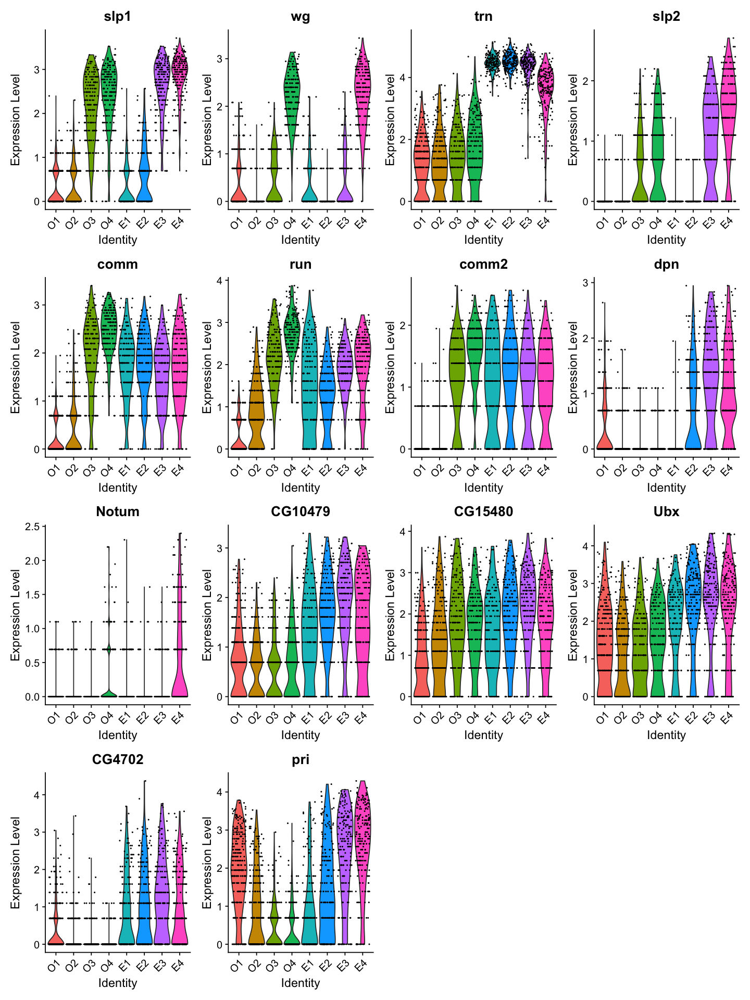

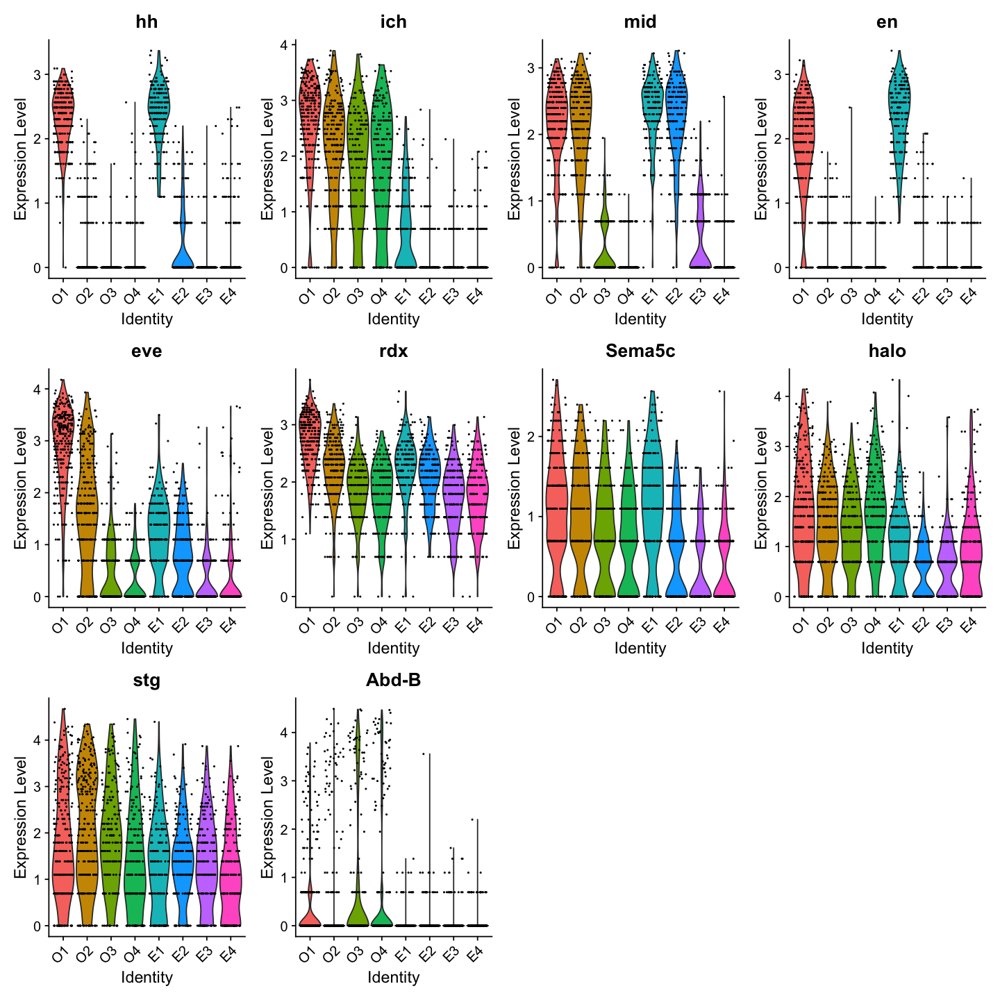

In [18]:
DE_E4vsO1 <- FindMarkers(
  seu_PR_VF3000,
  ident.1 = "E4",
  ident.2 = "O1",
  logfc.threshold = log(1.75),
  test.use = "MAST",
  verbose = TRUE,
  only.pos = FALSE,
)

DE_E4vsO1_FWER0.01_FC1.75 <- filter(DE_E4vsO1, p_val_adj <= 0.01)

compaired_ID <- rep("E4vsO1", length=nrow(DE_E4vsO1_FWER0.01_FC1.75)) 
DE_E4vsO1_FWER0.01_FC1.75 <- cbind(DE_E4vsO1_FWER0.01_FC1.75, compaired_ID)
DE_E4vsO1_FWER0.01_FC1.75

DE_E4vsO1_FWER0.01_FC1.75_plus <- filter(DE_E4vsO1, p_val_adj <= 0.01 & avg_logFC >= log(1.75) )
DE_E4vsO1_FWER0.01_FC1.75_plus
dim(DE_E4vsO1_FWER0.01_FC1.75_plus)
DE_E4vsO1_FWER0.01_FC1.75_minus <- filter(DE_E4vsO1, p_val_adj <= 0.01 & avg_logFC <= -log(1.75) )
DE_E4vsO1_FWER0.01_FC1.75_minus
dim(DE_E4vsO1_FWER0.01_FC1.75_minus)

options(repr.plot.width=12, repr.plot.height=　4*ceiling(nrow(DE_E4vsO1_FWER0.01_FC1.75_plus)/4))
"DEGs E4vsO1, avgFC >= 1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = rownames(DE_E4vsO1_FWER0.01_FC1.75_plus), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC1.75/DEGs_E4vsO1_plus_FC1.75.png", 
       width = 10.24, height = 2.56*ceiling(nrow(DE_E4vsO1_FWER0.01_FC1.75_plus)/4))

options(repr.plot.width=12, repr.plot.height=4*ceiling(nrow(DE_E4vsO1_FWER0.01_FC1.75_minus)/4))
"DEGs E4vsO1, avgFC <= -1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = rownames(DE_E4vsO1_FWER0.01_FC1.75_minus), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC1.75/DEGs_E4vsO1_minus_FC1.75.png", 
       width = 10.24, height = 2.56*ceiling(nrow(DE_E4vsO1_FWER0.01_FC1.75_minus)/4))

write.table(DE_E4vsO1_FWER0.01_FC1.75, file = "./DEG_boundary_FC1.75/DEGs_E4vsO1_FWER0.01_FC1.75.txt", 
            sep="\t", col.names=T, row.names=T, quote=F)

## Merge results

In [19]:
DE_O1vsO2_FWER0.01_FC1.75 <- DE_O1vsO2_FWER0.01_FC1.75 %>% rownames_to_column("gene_name")
DE_O2vsO3_FWER0.01_FC1.75 <- DE_O2vsO3_FWER0.01_FC1.75 %>% rownames_to_column("gene_name")
DE_O3vsO4_FWER0.01_FC1.75 <- DE_O3vsO4_FWER0.01_FC1.75 %>% rownames_to_column("gene_name")
DE_O4vsE1_FWER0.01_FC1.75 <- DE_O4vsE1_FWER0.01_FC1.75 %>% rownames_to_column("gene_name")
DE_E1vsE2_FWER0.01_FC1.75 <- DE_E1vsE2_FWER0.01_FC1.75 %>% rownames_to_column("gene_name")
DE_E2vsE3_FWER0.01_FC1.75 <- DE_E2vsE3_FWER0.01_FC1.75 %>% rownames_to_column("gene_name")
DE_E3vsE4_FWER0.01_FC1.75 <- DE_E3vsE4_FWER0.01_FC1.75 %>% rownames_to_column("gene_name")
DE_E4vsO1_FWER0.01_FC1.75 <- DE_E4vsO1_FWER0.01_FC1.75 %>% rownames_to_column("gene_name")
DE_all_FWER0.01_FC1.75 <- rbind(DE_O1vsO2_FWER0.01_FC1.75, DE_O2vsO3_FWER0.01_FC1.75, DE_O3vsO4_FWER0.01_FC1.75, 
                              DE_O4vsE1_FWER0.01_FC1.75, DE_E1vsE2_FWER0.01_FC1.75, DE_E2vsE3_FWER0.01_FC1.75,
                             DE_E3vsE4_FWER0.01_FC1.75, DE_E4vsO1_FWER0.01_FC1.75)

In [20]:
DE_all_FWER0.01_FC1.75

gene_name,p_val,avg_logFC,pct.1,pct.2,p_val_adj,compaired_ID
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
pxb,7.334201e-140,1.8718022,1.000,0.402,2.200260e-136,O1vsO2
hh,2.319608e-139,1.9208552,0.996,0.203,6.958825e-136,O1vsO2
en,1.535242e-109,1.8206127,0.944,0.199,4.605726e-106,O1vsO2
odd,2.486124e-95,-1.3606561,0.411,0.973,7.458371e-92,O1vsO2
gsb,2.544949e-77,2.2400056,0.814,0.123,7.634848e-74,O1vsO2
drm,9.135161e-69,-1.0551370,0.309,0.916,2.740548e-65,O1vsO2
sob,2.021455e-58,-0.9805319,0.298,0.889,6.064364e-55,O1vsO2
prd,1.366946e-49,1.2843001,0.775,0.226,4.100837e-46,O1vsO2
eve,1.688913e-42,0.9048521,0.989,0.835,5.066740e-39,O1vsO2


In [21]:
table(DE_all_FWER0.01_FC1.75$compaired_ID)


E1vsE2 E2vsE3 E3vsE4 E4vsO1 O1vsO2 O2vsO3 O3vsO4 O4vsE1 
    18     12     10     24     20     17      9     26 

In [22]:
length(unique(DE_all_FWER0.01_FC1.75$gene_name))

[1] 52

In [23]:
write.table(DE_all_FWER0.01_FC1.75, file = "./DEG_boundary_FC1.75/DEGs_all_FWER0.01_FC1.75.txt", 
            sep="\t", col.names=T, row.names=F, quote=F)

In [24]:
write(unique(DE_all_FWER0.01_FC1.75$gene_name), file = "./DEG_boundary_FC1.75/unique_DEGs_list_FWER0.01_FC1.75.txt" )

[1] "DEGs all unique, avgFC <= -1.5, FWER <= 0.01"

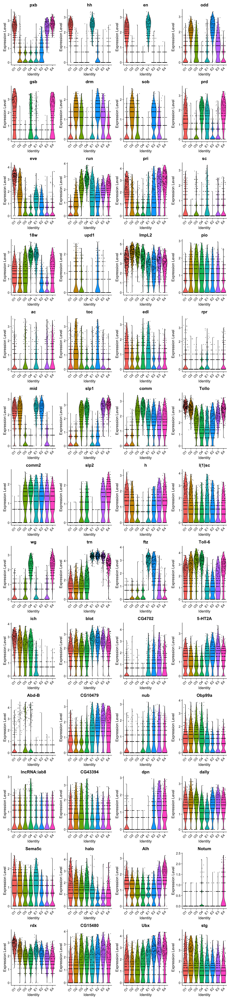

In [25]:
options(repr.plot.width=12, repr.plot.height=4*ceiling(length(unique(DE_all_FWER0.01_FC1.75$gene_name))/4))
"DEGs all unique, avgFC <= -1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = unique(DE_all_FWER0.01_FC1.75$gene_name), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC1.75/DEGs_unique_all_FC1.75.png", 
       width = 10.24, height = 2.56*ceiling(length(unique(DE_all_FWER0.01_FC1.75$gene_name))/4), limitsize = FALSE)

In [26]:
unique(DE_all_FWER0.01_FC1.75$gene_name)

[1] "pxb"         "hh"          "en"          "odd"         "gsb"        
 [6] "drm"         "sob"         "prd"         "eve"         "run"        
[11] "pri"         "sc"          "18w"         "upd1"        "ImpL2"      
[16] "pio"         "ac"          "toc"         "edl"         "rpr"        
[21] "mid"         "slp1"        "comm"        "Tollo"       "comm2"      
[26] "slp2"        "h"           "l(1)sc"      "wg"          "trn"        
[31] "ftz"         "Toll-6"      "ich"         "blot"        "CG4702"     
[36] "5-HT2A"      "Abd-B"       "CG10479"     "nub"         "Obp99a"     
[41] "lncRNA:iab8" "CG43394"     "dpn"         "dally"       "Sema5c"     
[46] "halo"        "Alh"         "Notum"       "rdx"         "CG15480"    
[51] "Ubx"         "stg"

In [27]:
options(repr.plot.width=3, repr.plot.height=4)
for (i in unique(DE_all_FWER0.01_FC1.75$gene_name)){
plot <- VlnPlot(seu_PR_VF3000, features = paste(i), pt.size = 0.2, ncol = 1)  + 
scale_fill_manual(values = c("skyblue1", "skyblue2", "skyblue3", "skyblue4", "magenta1", "magenta2", "magenta3", "magenta4")) +
NoLegend()
ggsave(filename=paste("./DEG_boundary_FC1.75/unique_plot/DEGs_unique_all_FC1.75_",i,".png", sep=""), 
       width = 3.84, height = 5.12, limitsize = FALSE)
}



In [28]:
sessionInfo()

R version 4.0.3 (2020-10-10)
Platform: x86_64-apple-darwin17.0 (64-bit)
Running under: macOS Catalina 10.15.7

Matrix products: default
BLAS:   /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRblas.dylib
LAPACK: /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRlapack.dylib

locale:
[1] ja_JP.UTF-8/ja_JP.UTF-8/ja_JP.UTF-8/C/ja_JP.UTF-8/ja_JP.UTF-8

attached base packages:
[1] parallel  stats4    stats     graphics  grDevices utils     datasets 
[8] methods   base     

other attached packages:
 [1] MAST_1.16.0                 SingleCellExperiment_1.12.0
 [3] SummarizedExperiment_1.20.0 Biobase_2.50.0             
 [5] GenomicRanges_1.42.0        GenomeInfoDb_1.26.2        
 [7] IRanges_2.24.1              S4Vectors_0.28.1           
 [9] BiocGenerics_0.36.0         MatrixGenerics_1.2.0       
[11] matrixStats_0.57.0          tibble_3.0.5               
[13] dplyr_1.0.3                 Matrix_1.3-2               
[15] data.table_1.13.6           magrittr_2.0.1